# Notebook to evaluate Sentinel-1 NRB sample product

Comparison of Sentinel-1 RTC output for an area in Western Austria, with steep terrain and forest cover. 

Two methods have been used to produce the RTC and per-pixel metadata:
1. (option 2) Normalize to gamma0_rtc in GRD pixels for all pixels; for each output pixel interpolate gamma0_rtc and interpolate beta0; then derive scattering_area by using the formula: scattering_area = beta0 / gamma0_rtc.
2. (option 3) For each output pixel interpolate beta0 and interpolate scattering_area; then derive gamma0_rtc by using the formula: gamma0_rtc = beta0 / scattering_area.

The optimal RTC output should have:
1. Minimal artifacts near radar shadow. Inside and near the radar shadow, scattering area is either zero or a small value, so a small uncertainty in the scattering area leads to large uncertainty in gamma0_rtc. Any pixel that is potentially affected by this uncertainty should be masked out.
2. Consistent backscatter measured between ascending and descending passes. The images used in the comparison are taken one day apart, therefore no signifant land cover change is expected between the two passes.



## Summary of results

Based on comparison of a few zoomed in areas:
1. Both option 2 and 3 currently uses resulting AREA image to mask shadow pixels (with a threshold of AREA<0.05). This may not be sufficient to capture pixels on the edge of radar shadow. Suggest masking pixels in GRD and then propagate to output pixel with max filter or dilation (any pixel next to radar shadow is potentially affected in interpolation and should be masked out).
2. Currently more pixels are masked as shadow in option 2, , so less artefacts are visible.
3. Option 3 produces smoother result in some areas and marginally more consistent measurements between ascending and descending passes. This is possibly because noise in AREA image is smoothed in interpolation. Overall, the difference between backscatter produced by option 2 and 3 is very small.
4. gamma0_rtc produced by option 2 has marginally smaller dependence on incidence angle (or area derived equivalent angle). But again, difference is small.



In [1]:
%matplotlib inline

import warnings
warnings.simplefilter('ignore')
import glob
import json
import os

import datacube
import numpy as np
import xarray as xr
from matplotlib import pyplot as plt
from matplotlib.colors import LogNorm
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

#import DE Africa script
import sys
sys.path.append('../Scripts')
from deafrica_plotting import display_map

### Load S1 sample data

In [2]:
def load_s1_sample(s1_sample_path, band, time=None):
    fname = glob.glob(f"{s1_sample_path}/*{band}.tif")[0]
    if time:
        return xr.open_rasterio(fname, chunks={"x": 1000, "y": 1000}).squeeze().to_dataset(name=band).expand_dims({'time':[time]})
    else:
        return xr.open_rasterio(fname, chunks={"x": 1000, "y": 1000}).squeeze().to_dataset(name=band)

In [3]:
# load data from option 2

bands = ["VV", "VH", "MASK", "AREA", "ANGLE"]
s1_sample_path = "s1_sample_austria/test_Austria_Descending_Bilinear_COPDEM30_Option2_2020-07-06"
data = [load_s1_sample(s1_sample_path, band, time=np.datetime64('2020-07-06')) for band in bands]
s1_sample_path = "s1_sample_austria/test_Austria_Ascending_Bilinear_COPDEM30_Option2_2020-07-07"
data += [load_s1_sample(s1_sample_path, band, time=np.datetime64('2020-07-07')) for band in bands]

combined_2 = xr.combine_by_coords(data)

In [4]:
# load data from option 3

bands = ["VV", "VH", "MASK", "AREA", "ANGLE"]
s1_sample_path = "s1_sample_austria/test_Austria_Descending_Bilinear_COPDEM30_Option3_2020-07-06"
data = [load_s1_sample(s1_sample_path, band, time=np.datetime64('2020-07-06')) for band in bands]
s1_sample_path = "s1_sample_austria/test_Austria_Ascending_Bilinear_COPDEM30_Option3_2020-07-07"
data += [load_s1_sample(s1_sample_path, band, time=np.datetime64('2020-07-07')) for band in bands]

combined_3 = xr.combine_by_coords(data)

In [5]:
# select area with terrain

lat, lon = (46.65,46.6),  (12.35,12.40) # steep but some rocky top

lat, lon = (46.3,46.2), (12.32,12.42) # steep, mostly forest cover

lat, lon = (46.36,46.26), (12.82,12.92) # slightly flatter, mostly forest cover

#lat, lon = (46.26,46.16), (12.0,12.1) # steep, forest cover

y=slice(*lat)
x=slice(*lon)

combined_sub_2 = combined_2.sel(y=y, x=x)
combined_sub_3 = combined_3.sel(y=y, x=x)

In [6]:
# check area in map

display_map(x=lon, y=lat)

### Angle

Different for ascending and descending. No difference for option 2 and 3.

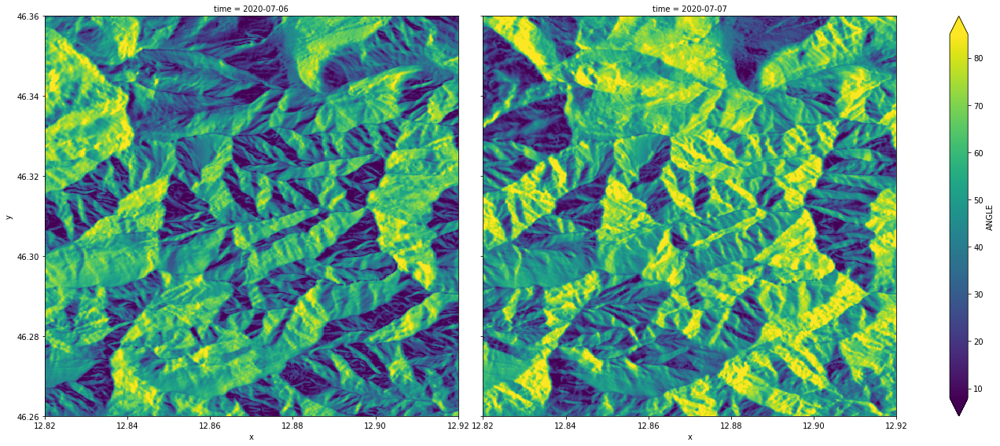

In [7]:
(combined_sub_2.ANGLE).plot.imshow(col='time', robust=True, figsize=(20,8));

### Mask

More areas are masked in optione 2.

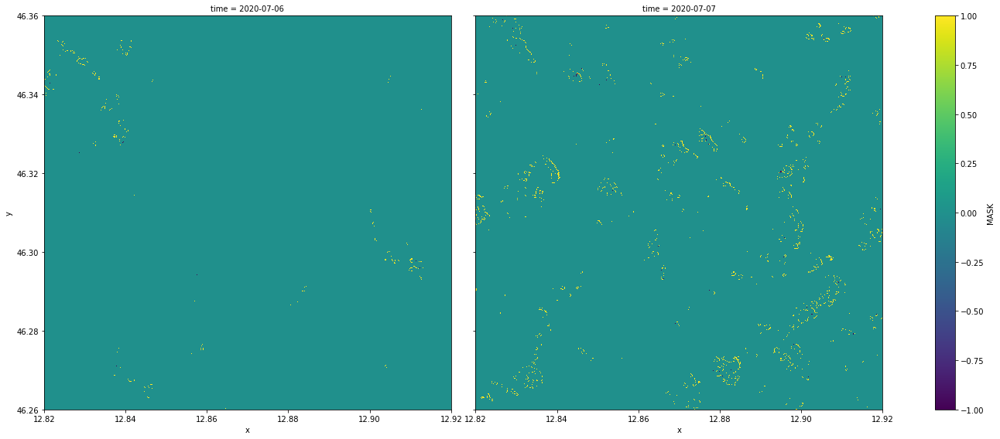

In [8]:
(combined_sub_2.MASK.astype(int)-combined_sub_3.MASK.astype(int)).plot.imshow(col='time', figsize=(20, 8), vmin=-1, vmax=1);

In [9]:
print("average mask difference:",(combined_2.MASK.astype(int)-combined_3.MASK.astype(int)).mean().values)
print("Fraction of shadow pixels in option 2:", (combined_2.MASK==2).mean().values)
print("Fraction of shadow pixels in option 3:", (combined_3.MASK==2).mean().values)

average mask difference: 0.00320192
Fraction of shadow pixels in option 2: 0.02437716
Fraction of shadow pixels in option 3: 0.02117524


### Area

Option 2 have smaller areas, hence larger gamma_rtc.

Masks are currently generated using AREA<0.05, this doesn't seem to be sufficient to cover the edge of the shadow. Interpolation might have increased the area for the edge pixels. Either the shadow mask needs to be produced in GRD and max interpolate or threshold area needs to be increased.

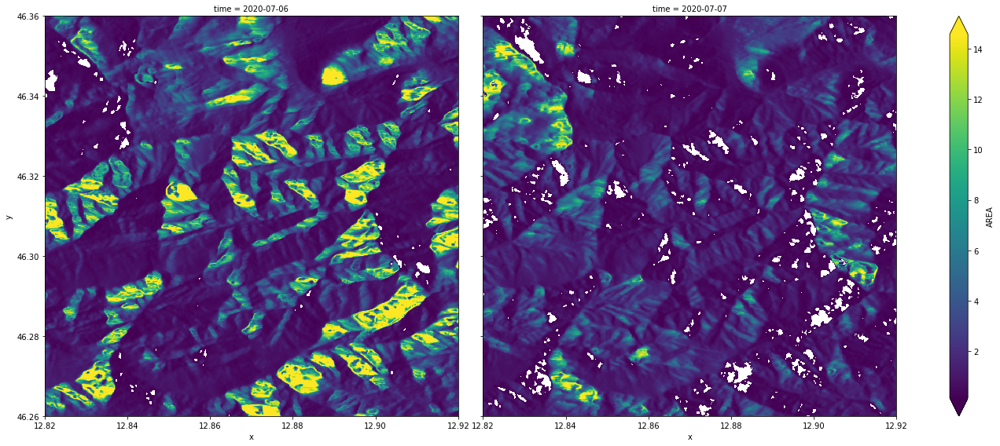

In [10]:
combined_sub_2.AREA.where(combined_sub_2.MASK==1).plot.imshow(col='time', robust=True, figsize=(20, 8));

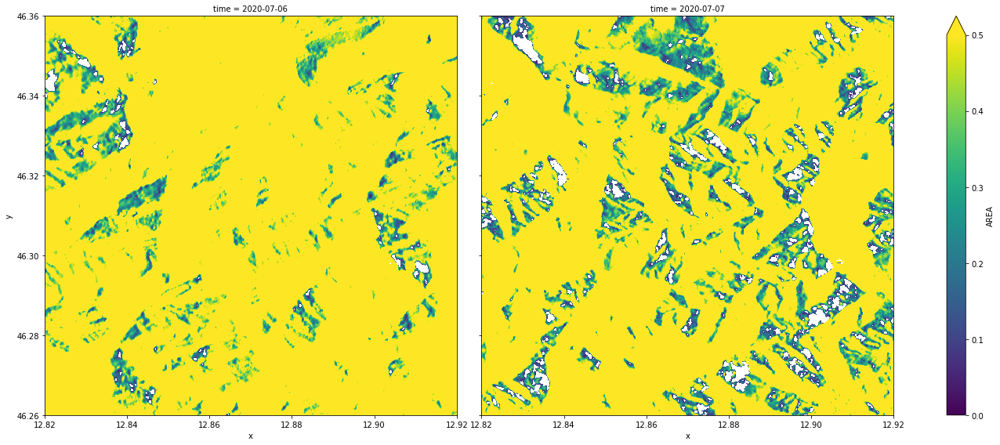

In [11]:
# stretch to show area gradient around shadow
combined_sub_2.AREA.where(combined_sub_2.MASK==1).plot.imshow(col='time', robust=True, figsize=(20, 8), vmin=0, vmax=0.5);

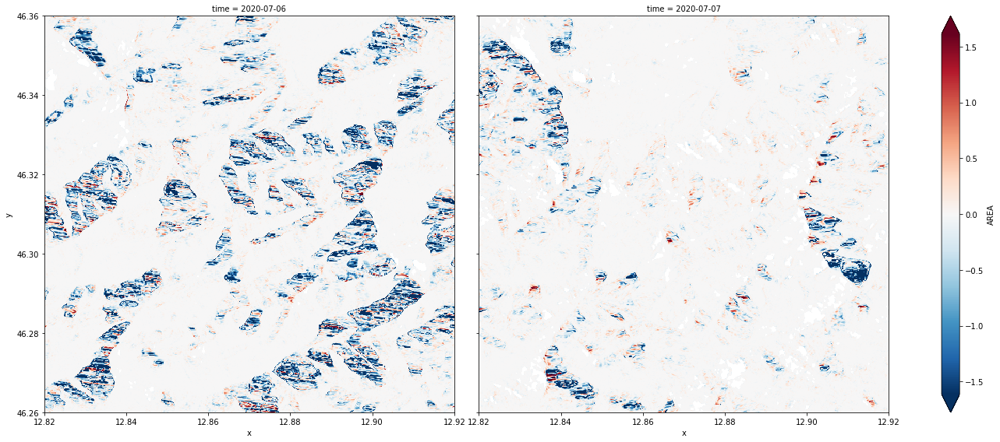

In [12]:
# option 2 have smaller areas in general
(combined_sub_2.AREA-combined_sub_3.AREA).where(combined_sub_3.MASK==1).where(combined_sub_2.MASK==1).plot.imshow(col='time', robust=True, figsize=(20,8));

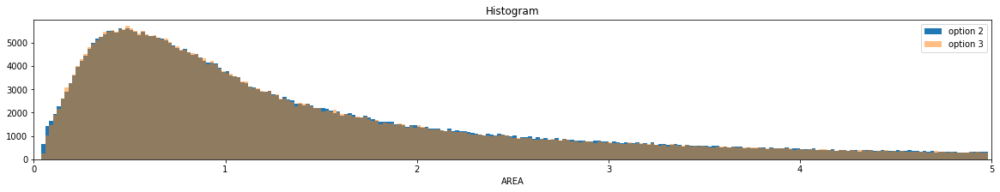

In [13]:
combined_sub_2.AREA.where(combined_sub_3.MASK==1).where(combined_sub_2.MASK==1).plot.hist(bins=np.arange(0,5,0.02), figsize=(20,3), label='option 2');
combined_sub_3.AREA.where(combined_sub_3.MASK==1).where(combined_sub_2.MASK==1).plot.hist(bins=np.arange(0,5,0.02), alpha=0.5, label='option 3');
plt.legend();
plt.xlim((0,5));

### Backscatter (RTC)

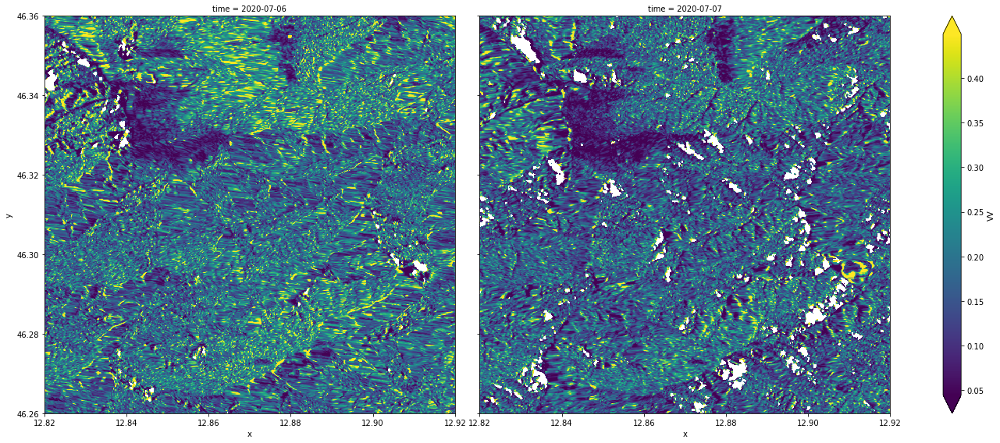

In [14]:
combined_sub_2.VV.where(combined_sub_2.AREA>0.05).plot.imshow(col='time', robust=True, figsize=(20, 8));

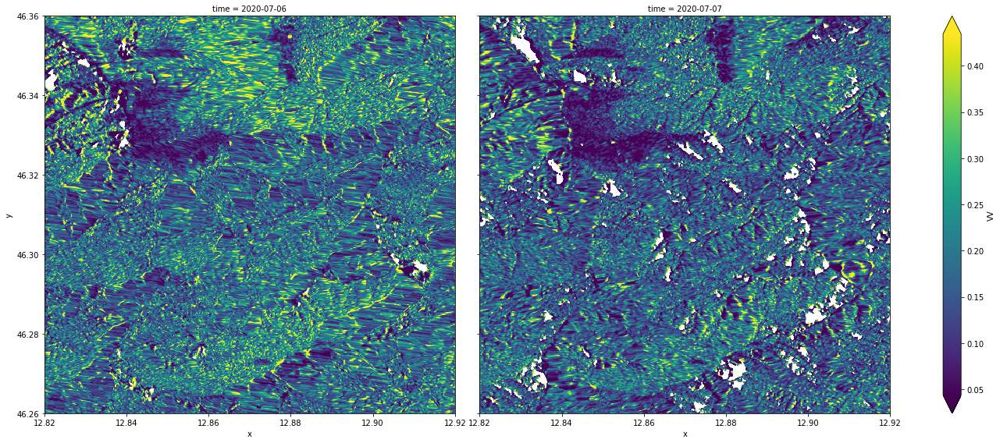

In [15]:
combined_sub_3.VV.where(combined_sub_3.AREA>0.05).plot.imshow(col='time', robust=True, figsize=(20, 8));

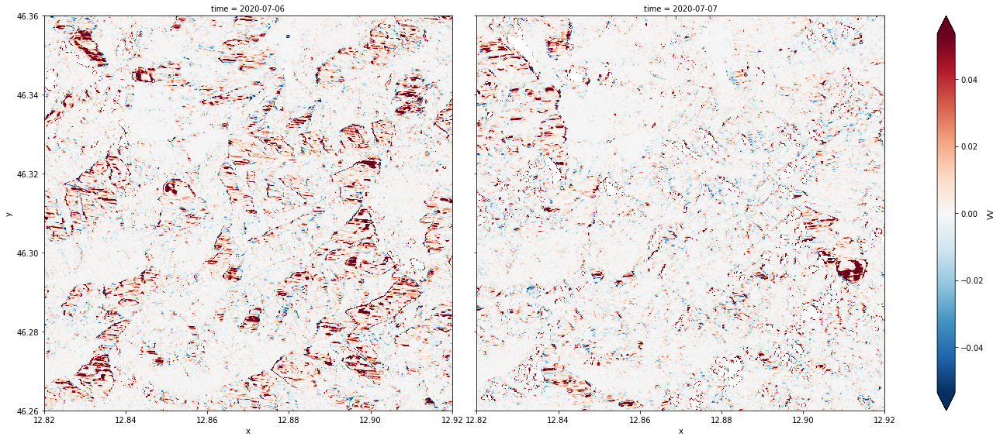

In [16]:
# higher backscatter in option 2
(combined_sub_2-combined_sub_3).VV.where(combined_sub_2.AREA>0.05).where(combined_sub_3.AREA>0.05).plot.imshow(col='time', robust=True, figsize=(20, 8));

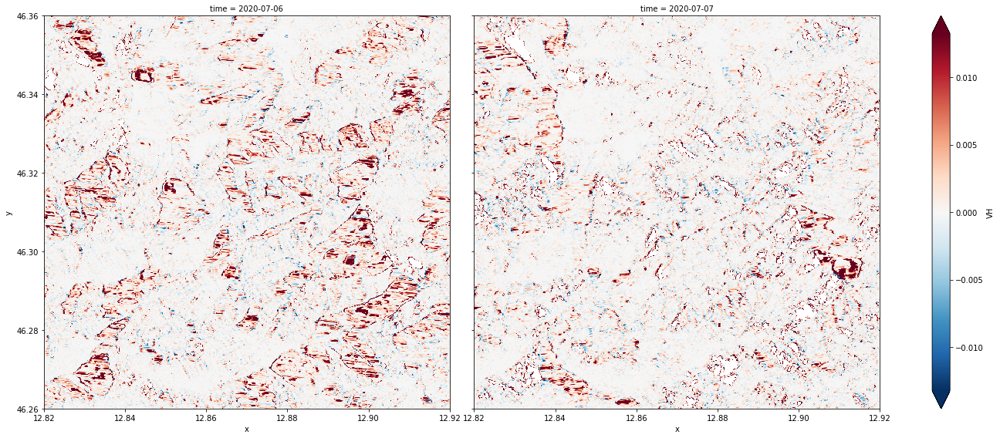

In [17]:
(combined_sub_2-combined_sub_3).VH.where(combined_sub_2.AREA>0.05).where(combined_sub_3.AREA>0.05).plot.imshow(col='time', robust=True, figsize=(20, 8));

### Backscatter from different pass directions

Option 3 gives marginally better agreement between ascending and decending passes

mean and std of difference VV between passes: 0.029805562 0.14925542
mean and std of difference VH between passes: 0.0045903306 0.03402781


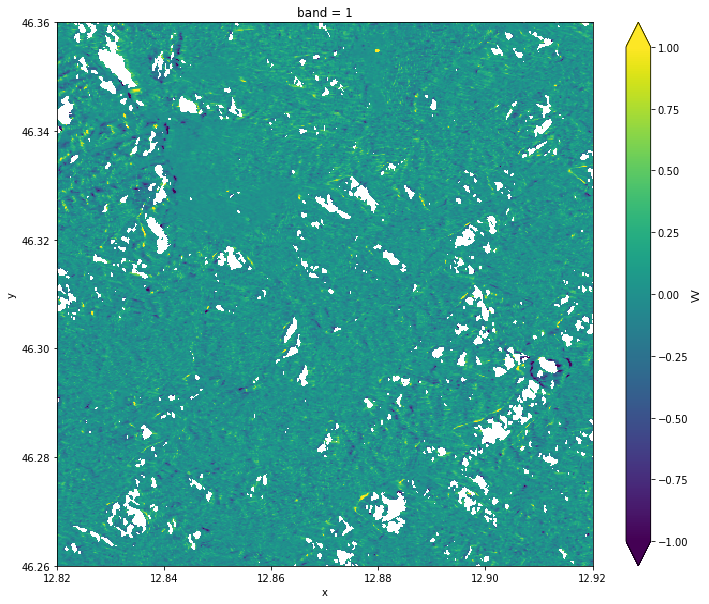

In [18]:
area = 0.1 # slightly extend shadow mask

diff_2 = (combined_sub_2.isel(time=0)-combined_sub_2.isel(time=1))[['VV', 'VH']].where(combined_sub_2.AREA.isel(time=0)>area).where(combined_sub_2.AREA.isel(time=1)>area)

diff_2.VV.plot.imshow(figsize=(12,10), vmin=-1, vmax=1);
print('mean and std of difference VV between passes:', diff_2.VV.mean().values, diff_2.VV.std().values)
print('mean and std of difference VH between passes:', diff_2.VH.mean().values, diff_2.VH.std().values)

mean and std of difference VV between passes: 0.02833997 0.14007325
mean and std of difference VH between passes: 0.0042903298 0.031414036


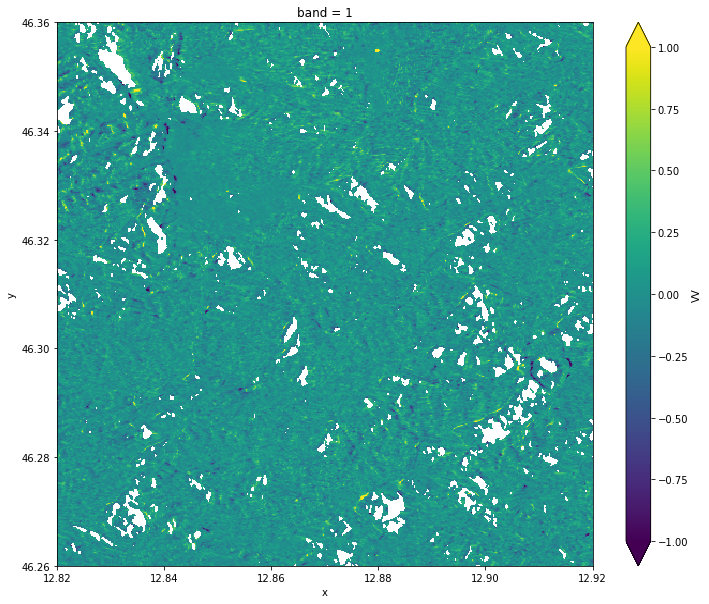

In [19]:
area = 0.1 # slightly extend shadow mask

diff_3 = (combined_sub_3.isel(time=0)-combined_sub_3.isel(time=1))[['VV', 'VH']].where(combined_sub_3.AREA.isel(time=0)>area).where(combined_sub_3.AREA.isel(time=1)>area)

diff_3.VV.plot.imshow(figsize=(12,10), vmin=-1, vmax=1);
print('mean and std of difference VV between passes:', diff_3.VV.mean().values, diff_3.VV.std().values)
print('mean and std of difference VH between passes:', diff_3.VH.mean().values, diff_3.VH.std().values)

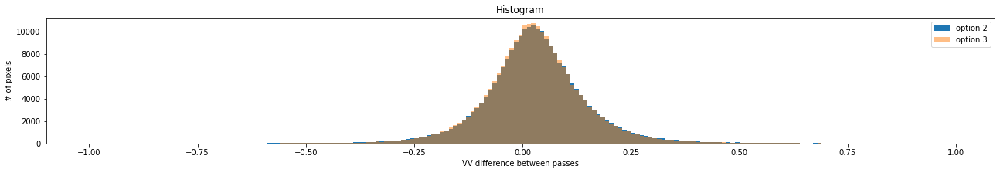

In [20]:
diff_2.VV.plot.hist(bins=np.arange(-1,1,0.01), figsize=(22,3), label='option 2');
diff_3.VV.plot.hist(bins=np.arange(-1,1,0.01), alpha=0.5, label='option 3');
plt.xlabel('VV difference between passes');
plt.ylabel('# of pixels');
plt.legend();

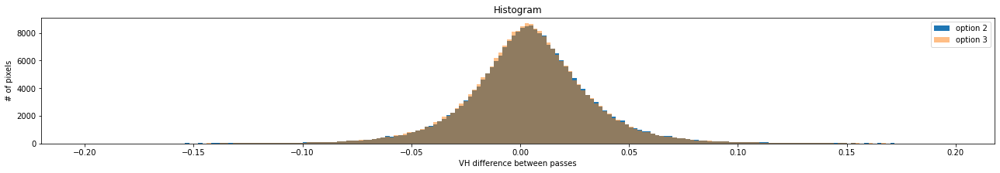

In [21]:
diff_2.VH.plot.hist(bins=np.arange(-0.2,0.2,0.002), figsize=(22,3), label='option 2');
diff_3.VH.plot.hist(bins=np.arange(-0.2,0.2,0.002), alpha=0.5, label='option 3');
plt.xlabel('VH difference between passes');
plt.ylabel('# of pixels');
plt.legend();

### Loal Resolution Weighting

In [22]:
weight_2 = 1/combined_sub_2.AREA
combined_sub_2_vv = (combined_sub_2.VV.where(combined_sub_2.AREA>0.1)*weight_2).sum('time')/weight_2.sum('time')

weight_3 = 1/combined_sub_3.AREA
combined_sub_3_vv = (combined_sub_3.VV.where(combined_sub_3.AREA>0.1)*weight_3).sum('time')/weight_3.sum('time')

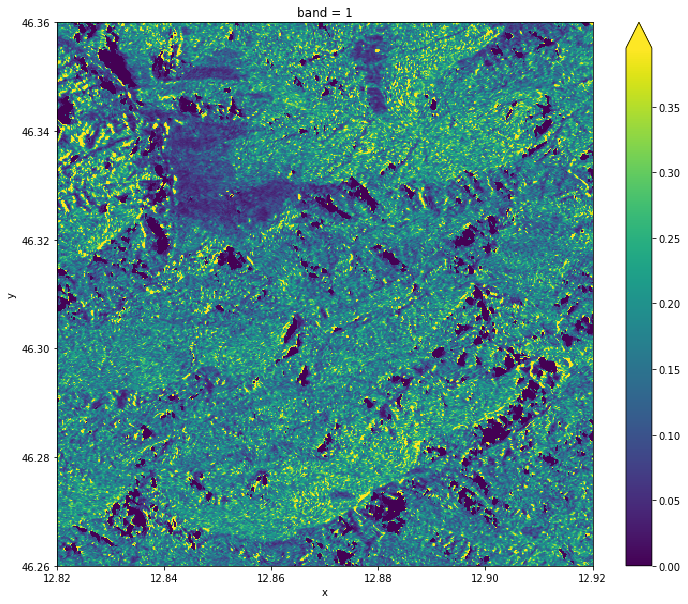

In [23]:
combined_sub_2_vv.plot.imshow(robust=True, figsize=(12,10));

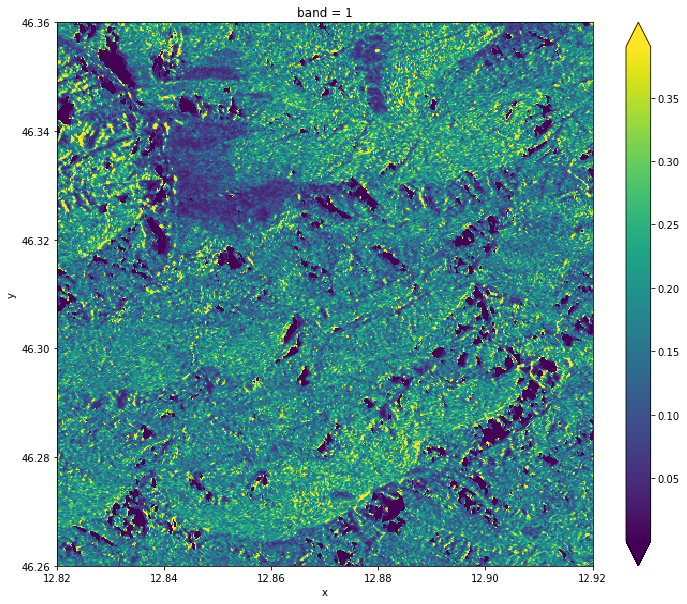

In [24]:
combined_sub_3_vv.plot.imshow(robust=True, figsize=(12,10));

### Effectiveness of RTC 

Check dependence on angle

### Load srtm 

In [25]:
dc = datacube.Datacube()

In [26]:
srtm = dc.load(product="srtm", x=lon, y=lat, resolution=(-0.0002, 0.0002)).squeeze()
srtm = srtm.rename({"latitude": "y", "longitude": "x"})

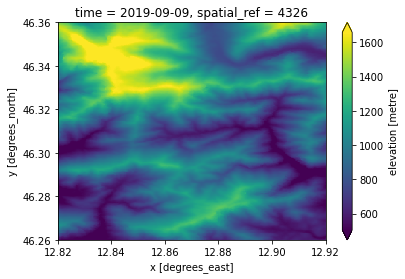

In [27]:
srtm.elevation.plot.imshow(robust=True);

### Load slope derived from SRTM

In [28]:
from datacube.utils.geometry import GeoBox, box, CRS
import rioxarray
from odc.algo import xr_reproject

def load_from_cog(url, name=None, resampling = 'nearest', chunks = dict(x=10_000, y=10_000), **kwargs):
    output_grid = kwargs.get('geobox')
    if output_grid is None:
        try:
            x = kwargs['x']
            y = kwargs['y']
            resolution = kwargs['resolution']
            output_crs = kwargs['output_crs']
            input_crs = kwargs.get('crs', 'EPSG:4326')
        except KeyError:
            print("x, y, resolution and output_crs are required if geobox is not supplied.")
            return
        # define output geometry
        gbox = box(x[0], y[0], x[1], y[1], crs = input_crs)
        # define output bounding box
        output_gbox = gbox.to_crs(crs=CRS(output_crs))
        # define output grid
        output_grid = GeoBox.from_geopolygon(output_gbox, resolution = resolution)

    img_all = rioxarray.open_rasterio(url, chunks=chunks).squeeze('band')
    if name is None: name = url.split('/')[-1].split('.')[0]
    img_all.name = name 
    return xr_reproject(img_all, output_grid, resampling=resampling).compute()

url = 'https://deafrica-data.s3-us-west-2.amazonaws.com/ancillary/dem-derivatives/cog_slope_africa.tif'

slope = load_from_cog(url, x=lon, y=lat, resolution=(-0.0002, 0.0002), output_crs = 'EPSG:4326')
slope= slope.rename({"latitude": "y", "longitude": "x"})

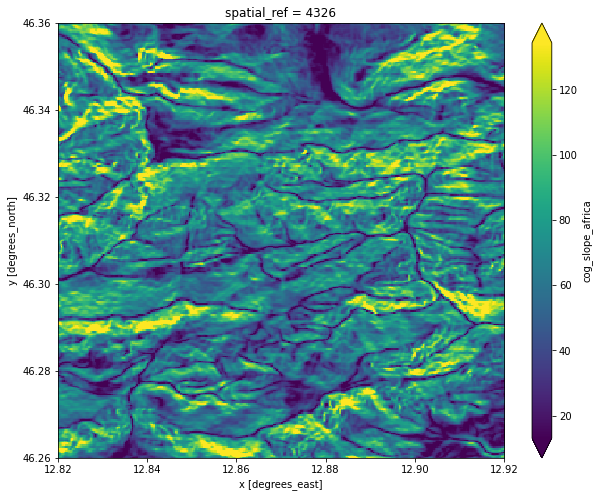

In [29]:
slope.plot.imshow(robust=True, figsize=(10,8));

In [30]:
high_slope = 60
print("fraction of high slope area", (slope>high_slope).mean().values)

fraction of high slope area 0.560768


In [31]:
combined_sub_2["VV_db"] = 10 * np.log10(combined_sub_2["VV"])
combined_sub_2["VH_db"] = 10 * np.log10(combined_sub_2["VH"])
combined_sub_3["VV_db"] = 10 * np.log10(combined_sub_3["VV"])
combined_sub_3["VH_db"] = 10 * np.log10(combined_sub_3["VH"])

In [32]:
# vegetation index
veg_2 = 4 * combined_sub_2.VH / (combined_sub_2.VH + combined_sub_2.VV)
veg_3 = 4 * combined_sub_3.VH / (combined_sub_3.VH + combined_sub_3.VV)

In [33]:
# super rough forest area estimate
forest_2 = (veg_2 > 0.8) & (combined_sub_2.VV_db > -15) #& (srtm.elevation.values>800)
forest_3 = (veg_3 > 0.8) & (combined_sub_3.VV_db > -15) #& (srtm.elevation.values>800)

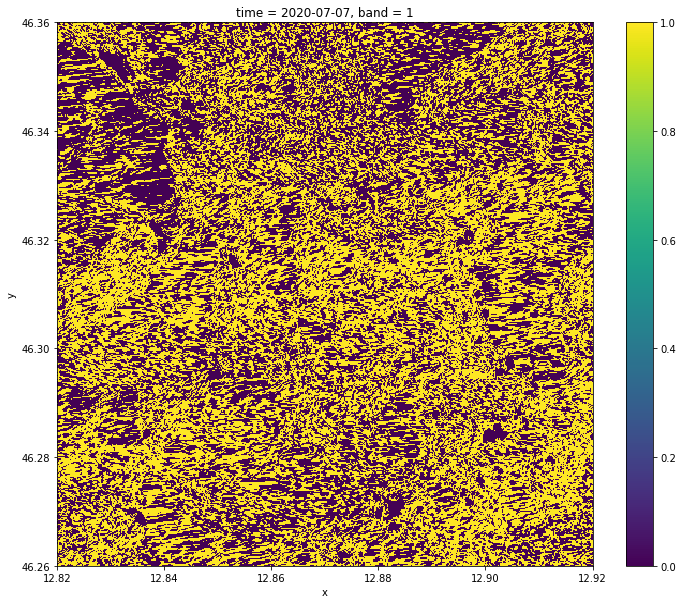

In [34]:
forest_2.isel(time=1).plot.imshow(robust=True, figsize=(12,10));

In [35]:
def plot_linear(arr1, arr2, band, xedges = list(np.arange(0, 90, 1)), yedges = list(np.arange(-15, 0, 0.01))):
    valid = (~np.isnan(arr1)) & (~np.isnan(arr2))
    arr1, arr2 = arr1[valid], arr2[valid]
    regr = linear_model.LinearRegression(fit_intercept=True)
    regr.fit(arr1[:, np.newaxis], arr2[:, np.newaxis])
    ## The coefficients
    print(
        "Band:{0}, slope={1}, intercept={2}, r2={3}".format(
        band,
        regr.coef_[0][0],
        regr.intercept_[0],
        regr.score(arr1[:, np.newaxis], arr2[:, np.newaxis]),
        )
    )

    X, Y = np.meshgrid(xedges[:-1], yedges[:-1])
    cmname = "YlGnBu"
    hist, xe, ye = np.histogram2d(arr2, arr1, bins=(yedges, xedges))
    plt.pcolor(X, Y, hist, cmap=cmname, norm=LogNorm(1, vmax=hist.max()));
    plt.colorbar();
    plt.contour(X, Y, np.log10(hist), cmap=cmname, levels=5);
    plt.plot(xedges, regr.predict(np.array(xedges)[:, np.newaxis]), ":");
    plt.xlabel('Equivalent angle');
    plt.ylabel(band);

Band:VV_db, slope=0.0014712376287207007, intercept=-8.757936477661133, r2=0.0002597472981055171


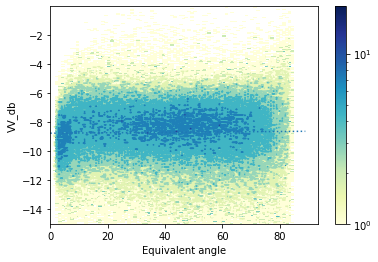

In [36]:
band = "VV_db"

arr1 = (np.arctan(1/combined_sub_2.AREA)*180./np.pi).where(combined_sub_2.AREA>0.1).where(forest_2).values.flatten()
arr2 = combined_sub_2[band].where(combined_sub_2.AREA>0.1).where(forest_2).values.flatten()
plot_linear(arr1, arr2, band, xedges = list(np.arange(0, 90, 1)), yedges = list(np.arange(-15, 0, 0.01)))

Band:VV_db, slope=0.003512624418362975, intercept=-8.902918815612793, r2=0.0015286570053789639


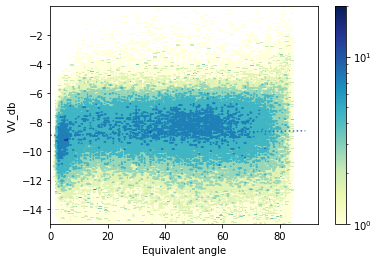

In [37]:
band = "VV_db"

arr1 = (np.arctan(1/combined_sub_3.AREA)*180./np.pi).where(combined_sub_3.AREA>0.1).where(forest_3).values.flatten()
arr2 = combined_sub_3[band].where(combined_sub_3.AREA>0.1).where(forest_3).values.flatten()
plot_linear(arr1, arr2, band, xedges = list(np.arange(0, 90, 1)), yedges = list(np.arange(-15, 0, 0.01)))

Band:VH_db, slope=0.007956044748425484, intercept=-13.468971252441406, r2=0.007761635126516064


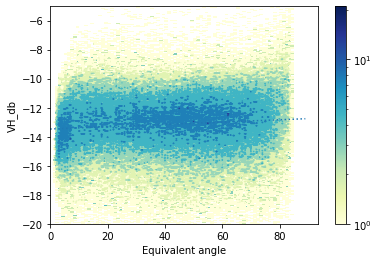

In [38]:
band = "VH_db"

arr1 = (np.arctan(1/combined_sub_2.AREA)*180./np.pi).where(combined_sub_2.AREA>0.1).where(forest_2).values.flatten()
arr2 = combined_sub_2[band].where(combined_sub_2.AREA>0.1).where(forest_2).values.flatten()
plot_linear(arr1, arr2, band, xedges = list(np.arange(0, 90, 1)), yedges = list(np.arange(-20, -5, 0.01)))

Band:VH_db, slope=0.00968517642468214, intercept=-13.597759246826172, r2=0.01191007237071906


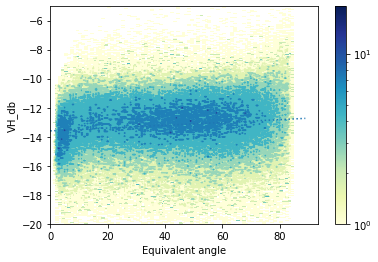

In [39]:
band = "VH_db"

arr1 = (np.arctan(1/combined_sub_3.AREA)*180./np.pi).where(combined_sub_3.AREA>0.1).where(forest_3).values.flatten()
arr2 = combined_sub_3[band].where(combined_sub_3.AREA>0.1).where(forest_3).values.flatten()
plot_linear(arr1, arr2, band, xedges = list(np.arange(0, 90, 1)), yedges = list(np.arange(-20, -5, 0.01)))

## Filtered

Speckle filter to reduce noise

In [40]:
from scipy.ndimage.filters import uniform_filter
from scipy.ndimage.measurements import variance

def lee_filter(da, size):
    """
    Apply lee filter of specified window size.
    Adapted from https://stackoverflow.com/questions/39785970/speckle-lee-filter-in-python

    Option to fill negative pixel with grey_dilation
    """
    img = da.values
    img_mean = uniform_filter(img, (size, size))
    img_sqr_mean = uniform_filter(img**2, (size, size))
    img_variance = img_sqr_mean - img_mean**2

    overall_variance = variance(img)

    img_weights = img_variance / (img_variance + overall_variance)
    img_output = img_mean + img_weights * (img - img_mean)
    
    return img_output

def clean_filter(da, size):
    return lee_filter(da.where(~np.isinf(da), 0).where(da.notnull(), 0), size)

size = 5
for band in ['VV', 'VH']:
    combined_sub_2[f'{band}_filtered'] = combined_sub_2[band].groupby('time').apply(clean_filter, size=size)
    combined_sub_3[f'{band}_filtered'] = combined_sub_3[band].groupby('time').apply(clean_filter, size=size)


In [41]:
combined_sub_2['VH_VV'] = (combined_sub_2.VH_filtered/combined_sub_2.VV_filtered).compute()
combined_sub_2['VH_5'] = (combined_sub_2.VH_filtered*5).compute()
combined_sub_3['VH_VV'] = (combined_sub_3.VH_filtered/combined_sub_3.VV_filtered).compute()
combined_sub_3['VH_5'] = (combined_sub_3.VH_filtered*5).compute()

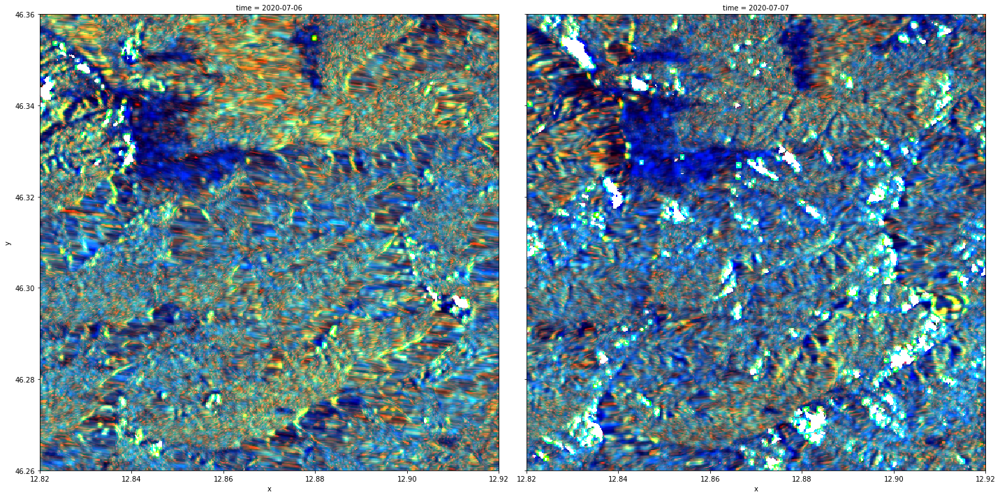

In [42]:
combined_sub_2[['VV','VH_5','VH_VV']].where(combined_sub_2.AREA>0.05).to_array().plot.imshow(col='time', figsize=(20,10), robust=True);

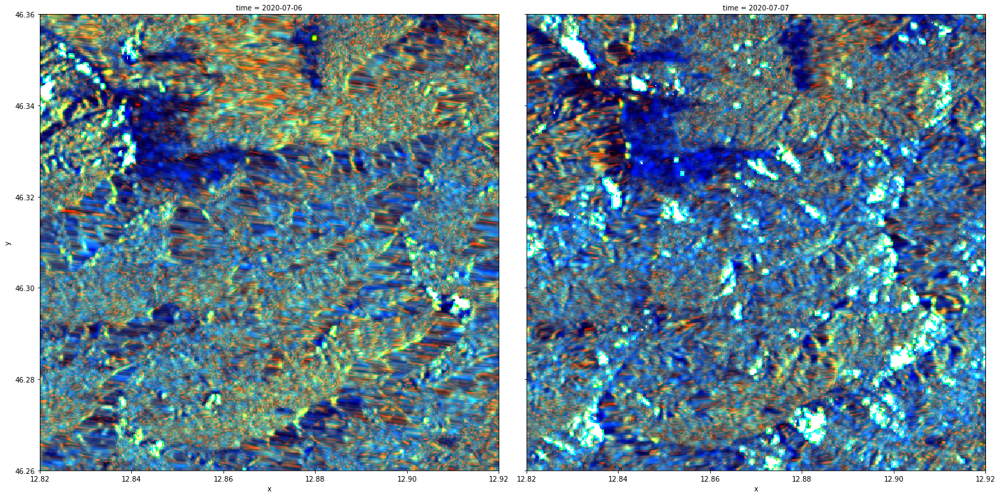

In [43]:
combined_sub_3[['VV','VH_5','VH_VV']].where(combined_sub_3.AREA>0.05).to_array().plot.imshow(col='time', figsize=(20,10), robust=True);

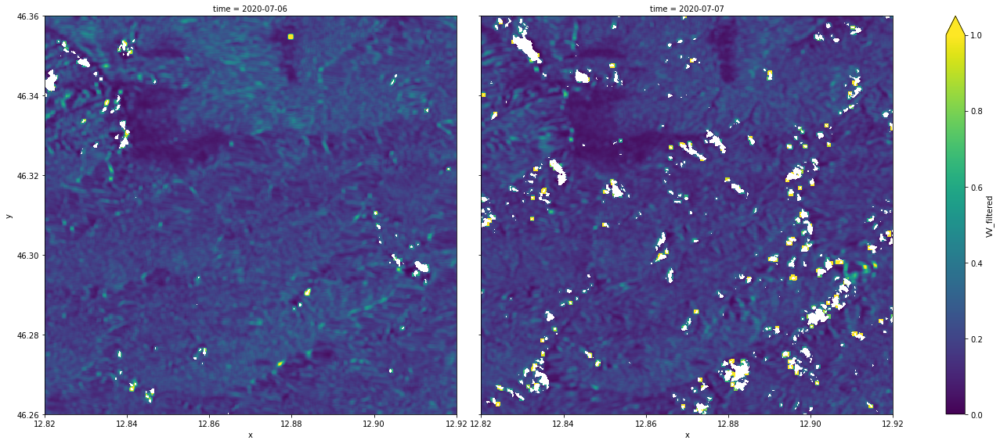

In [44]:
combined_sub_2.VV_filtered.where(combined_sub_2.AREA>0.05).plot.imshow(col='time', robust=True, figsize=(20,8), vmin=0, vmax=1);

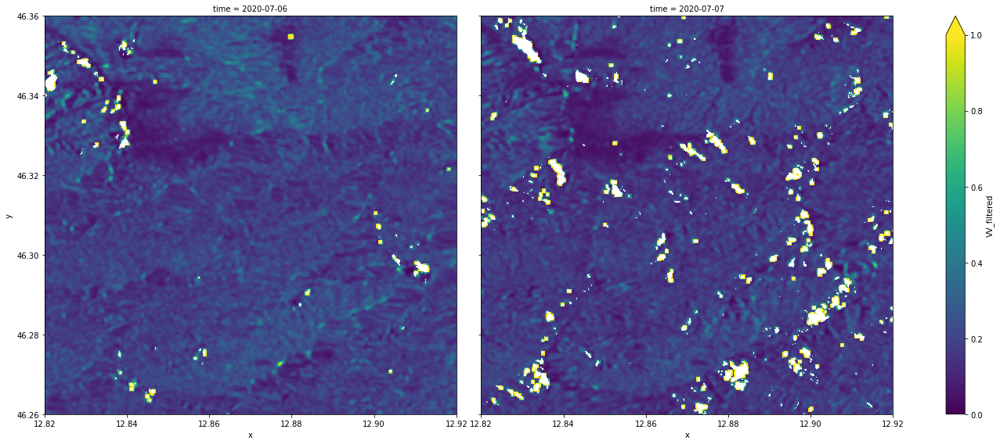

In [45]:
combined_sub_3.VV_filtered.where(combined_sub_3.AREA>0.05).plot.imshow(col='time', robust=True, figsize=(20,8), vmin=0, vmax=1);